
## Goal

Your goal in this assigment is to implement a Gaussian Bayes Classifier.


- **Gaussian Bayes**



#### Libraries
Ther are two additional libraries used which are not included in Anaconda package, nose and seaborn. You can install them using the following commands :
```sh
conda install -c anaconda nose=1.3.7
conda install -c anaconda seaborn=0.7.1
```
Version of different libraries used are listed below:
- Matplotlib **1.5.1**
- Pandas **0.18.1**
- Numpy **1.11.1**
- Scipy **0.17.1**
- Seaborn **0.7.1**

Code for checking version info is present in cell below.

#### Dead Kernal
In case kernel does not connect, and shows a dead kernal meggese in read : 
- Go to Kernal -> Change kernal, and choose any of the available kernels.
- Press ctrl + s and close the tab.
- Open the notebook again and the kernel will connect. If it still does not connect then go to Kernel -> restart.

**Note : ** Accuracies may slightly vary due to randomness in train-text split. 

In [28]:
%pylab inline
import scipy.stats
import pandas as pd
from collections import defaultdict
import seaborn as sns
#many important functions are already written and provided in tools.py 
# please have a look at these functions....
import tools as t


plt.style.use('ggplot')
matplotlib.rcParams['figure.figsize'] = (10.0, 8.0)
%load_ext autoreload 
%autoreload 2

%pylab is deprecated, use %matplotlib inline and import the required libraries.
Populating the interactive namespace from numpy and matplotlib
The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [29]:
print ("Matplotlib version : ", matplotlib.__version__)
print ("Pandas version : ", pd.__version__)
print ("Numpy version : ", np.__version__)
print ("Scipy version : ", scipy.__version__)
print ("Seaborn version : ", sns.__version__)

Matplotlib version :  3.7.2
Pandas version :  2.0.3
Numpy version :  1.24.3
Scipy version :  1.11.1
Seaborn version :  0.12.2


In [64]:
def multivariate_gaussian_pdf(x, mu, sigma):
    k = len(x)
    print(k)
    sigma_inv = np.linalg.inv(sigma)
    det_sigma = np.linalg.det(sigma)

    # (x - mu)^T * Sigma^-1 * (x - mu)
    x_mu = x - mu
    print(x_mu.shape)
    term = np.dot(np.dot(x_mu, sigma_inv), x_mu.T)

    # Multivariate Bayes for Cont formula
    norm_const = 1 / np.sqrt(((2 * np.pi )** k) * (det_sigma))
    exp_part = np.exp(-0.5 * term)
    
    return norm_const * exp_part

# x=[4.8, 3.0 , 1.6, 0.2]
# p = multivariate_gaussian_pdf(x, mean_setosa, cov_matrix_setosa)
# p * prob_setosa

4
(4,)


1.738667072232129

In [32]:
# YOUR CODE HERE
# raise NotImplementedError()

class GaussianBayes:
    ''' Implements the Gaussian Bayes For Classification... '''
    def __init__(self):
        
        self.class_labels = {}

        self.prior_probs = {}
        

        self.mean_vectors = {}
        
        self.cov_matrices = {}
        
        pass
    
    def train(self, X, Y):
        ''' Train the multiclass (or Binary) Bayes Rule using the given 
            X [m x n] data matrix and Y labels matrix'''
        
        # YOUR CODE HERE
        
        self.class_labels = np.unique(Y)
        
        class_wise_data = {c_label: [] for c_label in self.class_labels}
        self.prior_probs = {c_label: 0 for c_label in self.class_labels}
        self.mean_vectors = {c_label: [] for c_label in self.class_labels}
        self.cov_matrices = {c_label: [] for c_label in self.class_labels}


        for i in range(len(Y)):
            class_wise_data[Y[i]].append(X[i])
            
        for c_label in self.class_labels:
            p = len(class_wise_data[c_label]) / len(Y)
            self.prior_probs[c_label] = p
            
            self.mean_vectors[c_label] = np.mean(class_wise_data[c_label],axis=0)
            
            Z = class_wise_data[c_label] - self.mean_vectors[c_label]
            self.cov_matrices[c_label] = (np.dot(Z.T, Z)) / len(class_wise_data[c_label])
            
    
        
#         raise NotImplementedError()
        
    def test(self, X):
        
        ''' Run the trained classifiers on the given set of examples 
            For each example, you should return probability and its assigned class
            Input: X of m x d
            Output:
            pclasses: predicted class of each example
            probability: probability of each example falling in that predicted class...
        '''
        # YOUR CODE HERE
        
        def multivariate_gaussian_pdf(x, mu, sigma):
            k = len(x)
            print(k)
            sigma_inv = np.linalg.inv(sigma)
            det_sigma = np.linalg.det(sigma)

            # (x - mu)^T * Sigma^-1 * (x - mu)
            x_mu = x - mu
            print(x_mu.shape)
            term = np.dot(np.dot(x_mu, sigma_inv), x_mu.T)

            # Multivariate Bayes for Cont formula
            norm_const = 1 / np.sqrt(((2 * np.pi )** k) * (det_sigma))
            exp_part = np.exp(-0.5 * term)

            return norm_const * exp_part
        
        specie = []
        pr = [] 
        for i in range(len(X)):
            posterior_probs = []
            c_l = []
            for c_label in self.class_labels:
                posterior_probs.append(multivariate_gaussian_pdf(X[i], self.mean_vectors[c_label], self.cov_matrices[c_label]) * self.prior_probs[c_label])
                c_l.append(c_label)
                
            ind = np.argmax(posterior_probs)
            pr.append(posterior_probs[ind])
            specie.append(c_l[ind])
            
        return np.array(specie), pr
        
#         raise NotImplementedError()
        
    def predict(self, X):
        return self.test(X)[0]    
        

In [33]:
data=pd.read_csv('./iris.data')
data.columns=['SepalLength','SepalWidth','PetalLength','PetalWidth','Class']
print (data.describe())

       SepalLength  SepalWidth  PetalLength  PetalWidth
count   149.000000  149.000000   149.000000  149.000000
mean      5.848322    3.051007     3.774497    1.205369
std       0.828594    0.433499     1.759651    0.761292
min       4.300000    2.000000     1.000000    0.100000
25%       5.100000    2.800000     1.600000    0.300000
50%       5.800000    3.000000     4.400000    1.300000
75%       6.400000    3.300000     5.100000    1.800000
max       7.900000    4.400000     6.900000    2.500000


#### Lets Visualize the data

C:\Users\Mam Hifza Tahir\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


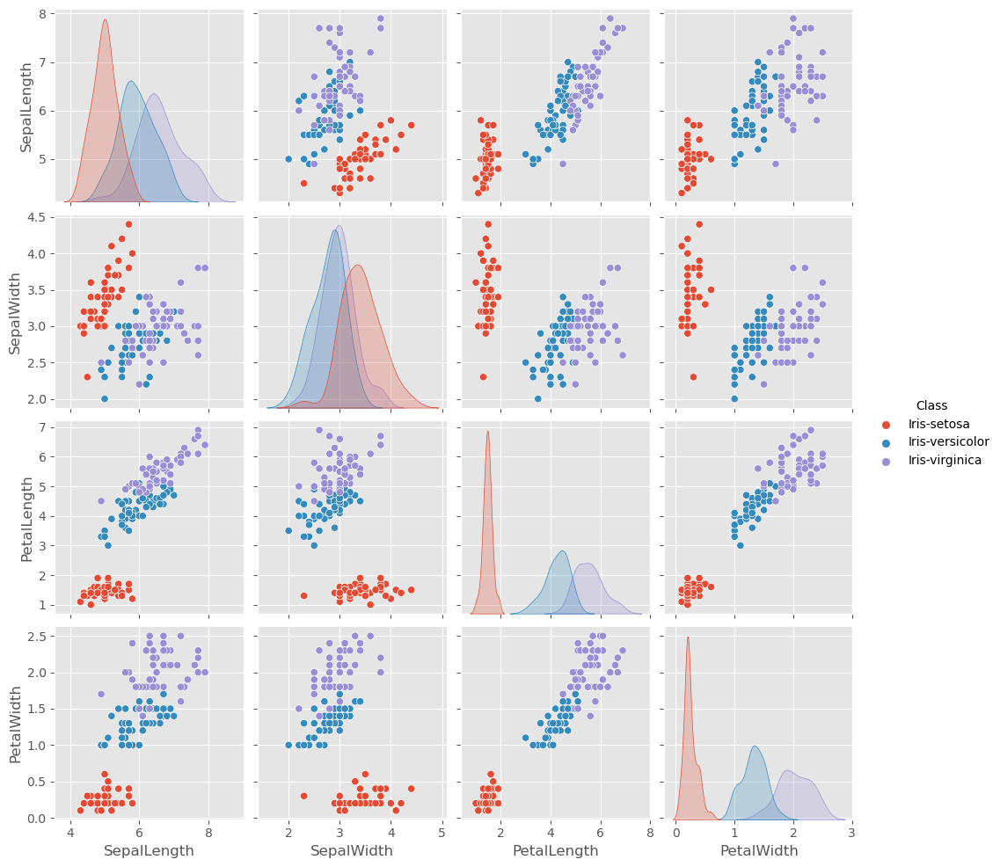

In [34]:
sns.pairplot(data, hue="Class")

#### Get your data in matrix

In [35]:
X=np.asarray(data[['SepalLength','SepalWidth','PetalLength','PetalWidth']].dropna())
Y=np.asarray(data['Class'].dropna())
print (" Data Set Dimensions=", X.shape, " True Class labels dimensions", Y.shape)

 Data Set Dimensions= (149, 4)  True Class labels dimensions (149,)


In [36]:
len(Y)

149

#### Let's Plot the Data

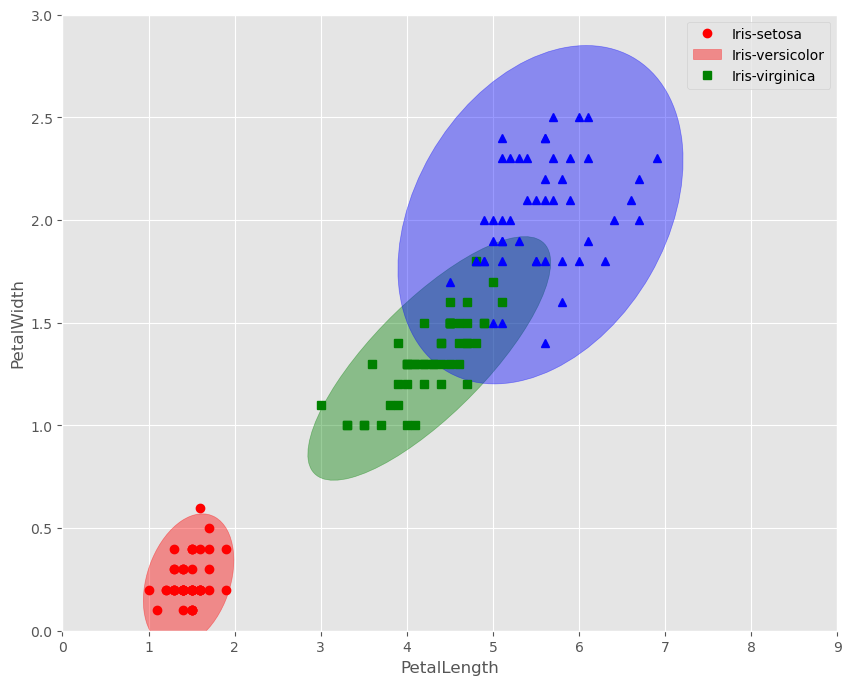

In [37]:
#Lets plot the Complete data, with its covariance matrix...
# Remember seeing is believing
featnames=data.columns
t.plotCov(X[:,2:],Y,labels=featnames.values[2:4])

### Splitting the Data into Training and Testing Sets
There must be a validation set but for this case we are using only two sets, training and validation sets...

In [38]:
# Split your data into training and test-set... 
# see the documentation of split_data in tools for further information...

Xtrain,Ytrain,Xtest,Ytest=t.split_data(X,Y)

print (" Training Data Set Dimensions=", Xtrain.shape, "Training True Class labels dimensions", Ytrain.shape) 
print (" Test Data Set Dimensions=", Xtest.shape, "Test True Class labels dimensions", Ytrain.shape)

 Training Data Set Dimensions= (104, 4) Training True Class labels dimensions (104,)
 Test Data Set Dimensions= (45, 4) Test True Class labels dimensions (104,)


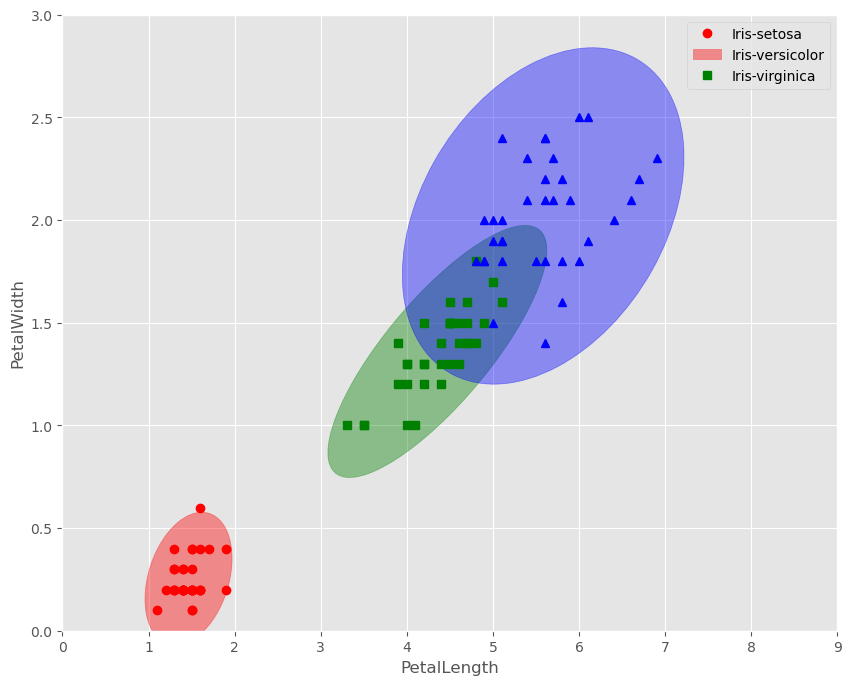

In [39]:
#Lets plot the training data...
t.plotCov(Xtrain[:,2:],Ytrain, labels=featnames.values[2:4])
# so we will be estimating these covariance matrices and means...

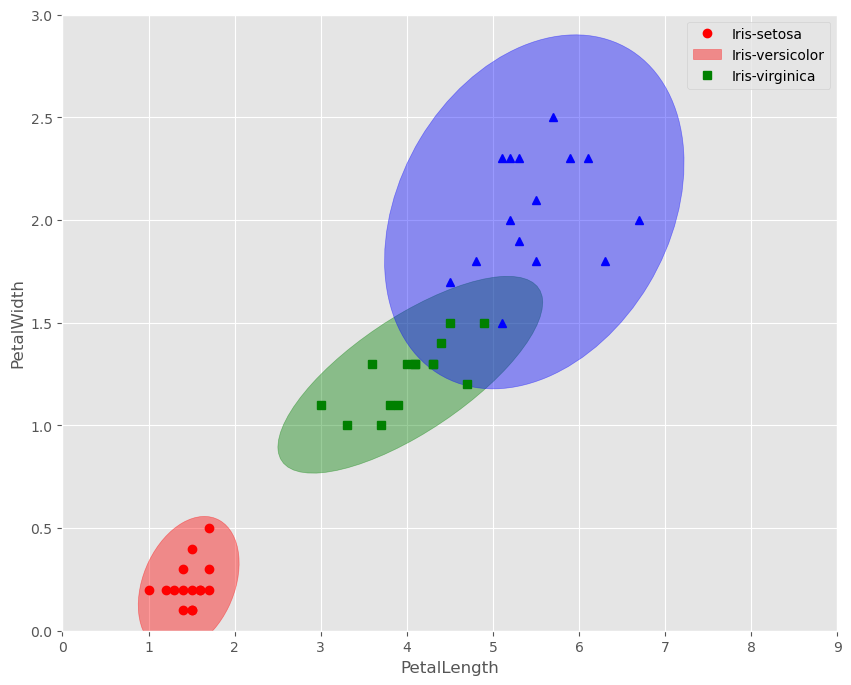

In [40]:
#Lets plot the test data...
t.plotCov(Xtest[:,2:],Ytest,labels=featnames.values[2:4])

Training Time
========
Let's train a Gaussian Bayes, first using two attributes.
- What Two Attributes to use ? Any Guess...

In [41]:
# Lets train a Gaussian Bayes Classifier on Petal Length and Width
gb=GaussianBayes()
gb.train(Xtrain[:,2:],Ytrain)

In [42]:
#Lets test it on the set of unseen examples...

pclasses,res=gb.test(Xtest[:,2:])


2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)


In [43]:
pclasses

array(['Iris-setosa', 'Iris-setosa', 'Iris-setosa', 'Iris-setosa',
       'Iris-setosa', 'Iris-setosa', 'Iris-setosa', 'Iris-setosa',
       'Iris-setosa', 'Iris-setosa', 'Iris-setosa', 'Iris-setosa',
       'Iris-setosa', 'Iris-setosa', 'Iris-setosa', 'Iris-versicolor',
       'Iris-versicolor', 'Iris-versicolor', 'Iris-versicolor',
       'Iris-versicolor', 'Iris-versicolor', 'Iris-versicolor',
       'Iris-versicolor', 'Iris-versicolor', 'Iris-versicolor',
       'Iris-versicolor', 'Iris-versicolor', 'Iris-versicolor',
       'Iris-versicolor', 'Iris-versicolor', 'Iris-virginica',
       'Iris-virginica', 'Iris-virginica', 'Iris-virginica',
       'Iris-virginica', 'Iris-versicolor', 'Iris-virginica',
       'Iris-virginica', 'Iris-virginica', 'Iris-virginica',
       'Iris-virginica', 'Iris-virginica', 'Iris-versicolor',
       'Iris-virginica', 'Iris-virginica'], dtype='<U15')

Lets see how good we are doing...
==================

In [44]:
#Lets see how good we are doing...
print (pclasses==Ytest)
print (Ytest.shape[0])

[ True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True False
  True  True  True  True  True  True False  True  True]
45


In [45]:
# Using Just two attributes, accuracy is 

print (np.sum(pclasses==Ytest))
print ("Accuracy = ", np.sum(pclasses==Ytest)/float(Ytest.shape[0]))

43
Accuracy =  0.9555555555555556


 Plotting the Decision Surface of Training Set... 
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2

TypeError: ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''

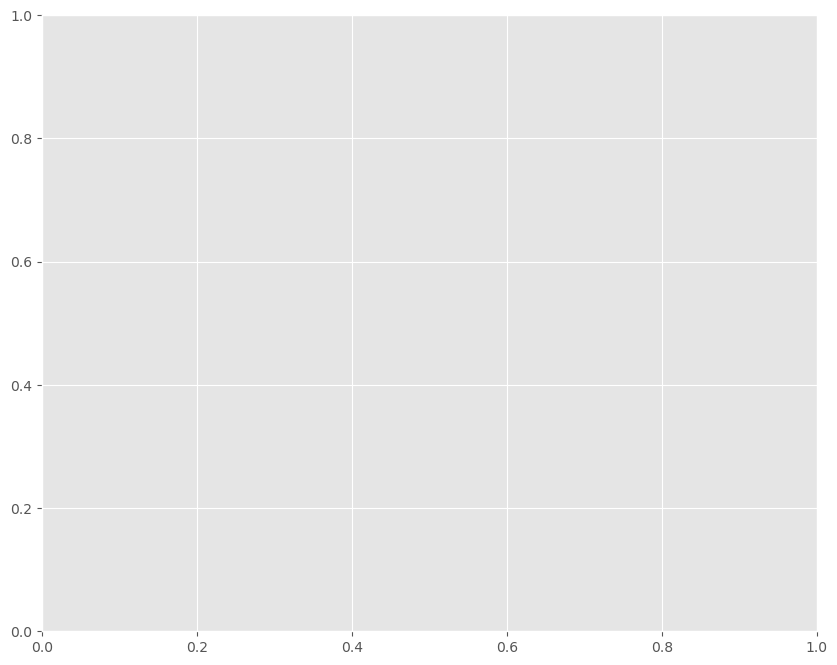

In [46]:
print (" Plotting the Decision Surface of Training Set... ")
t.plot_decision_regions(Xtrain[:,2:],Ytrain,clf=gb, res=0.02, cycle_marker=True, legend=1)

### Test cases for your classifier

In [47]:
from nose.tools import assert_greater_equal, assert_is_not_none
import pandas as pd
data=pd.read_csv('./iris.data')
data.columns=['SepalLength','SepalWidth','PetalLength','PetalWidth','Class']
X=np.asarray(data[['SepalLength','SepalWidth','PetalLength','PetalWidth']].dropna())
Y=np.asarray(data['Class'].dropna())

data_val = pd.read_csv('./iris_val.data')
data_val.columns = ['SepalLength','SepalWidth','PetalLength','PetalWidth','Class']
X_val = np.asarray(data_val[['SepalLength','SepalWidth','PetalLength','PetalWidth']].dropna())
Y_val = np.asarray(data_val['Class'].dropna())

gb_val=GaussianBayes()
gb_val.train(X[:,2:],Y)
pclasses_val, _ = gb_val.test(X_val[:,2:])
acc_val = np.sum(pclasses_val == Y_val) / float(pclasses_val.shape[0])

assert_greater_equal(acc_val, 0.90, msg="Acc must be greater then 90%")

cls =gb_val.predict(np.array([2,2]).reshape((1,2)))
assert_is_not_none(cls, msg="Predict should work for single example")

print("All cases passed !")

2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)

## Question: What can you conclude from the above decision Region

# K-Fold Cross Validation

Since our dataset is not too big, to ensure that we are reporting true picture of our classifier, 
we will have to cross validate and report the mean accuracy across the folds to reflect the true 
picture of our classifier.

In [48]:
# Now lets cross validate, and test the result...
nfolds=4
folds=t.generate_folds(X,Y,nfolds)

#now lets train and test on these folds...
totacc=[]
for k in range(nfolds):
    gb=GaussianBayes()
    gb.train(folds[k][0][:,2:],folds[k][1])
    pclasses,res=gb.test(folds[k][2][:,2:])
    acc=np.sum(pclasses==folds[k][3])/float(folds[k][3].shape[0])
    print ("[Info] Fold {} Accuracy = {}".format(k+1, acc))
    totacc.append(acc)

print (totacc, 'Mean Accuracy =', np.mean(totacc))

Generating CV data for 3 classes
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
[Info] Fold 1 Accuracy = 0.9722222222222222
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)


Hmm Quite Impressive...
--------------------------------

In [49]:
# Lets go and use all the four attributes...
gb.train(Xtrain,Ytrain)

In [50]:
pclasses,res=gb.test(Xtest)

4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)


#### Do you expect your Test accuracy to increase or decrease ?

In [51]:
# Using all four attributes, accuracy is 
print ("Accuracy = ", np.sum(pclasses==Ytest)/float(Ytest.shape[0]))

Accuracy =  0.9777777777777777


### Test cases for all four attributes

In [52]:
from nose.tools import assert_greater_equal, assert_is_not_none
import pandas as pd
data=pd.read_csv('./iris.data')
data.columns=['SepalLength','SepalWidth','PetalLength','PetalWidth','Class']
X=np.asarray(data[['SepalLength','SepalWidth','PetalLength','PetalWidth']].dropna())
Y=np.asarray(data['Class'].dropna())

data_val = pd.read_csv('./iris_val.data')
data_val.columns = ['SepalLength','SepalWidth','PetalLength','PetalWidth','Class']
X_val = np.asarray(data_val[['SepalLength','SepalWidth','PetalLength','PetalWidth']].dropna())
Y_val = np.asarray(data_val['Class'].dropna())

gb_val=GaussianBayes()
gb_val.train(X,Y)
pclasses_val, _ = gb_val.test(X_val)
acc_val = np.sum(pclasses_val == Y_val) / float(pclasses_val.shape[0])

assert_greater_equal(acc_val, 0.90, msg="Acc must be greater then 90%")

cls =gb_val.predict(np.array([2,2,2,2]).reshape((1,4)))
assert_is_not_none(cls, msg="Predict should work for single example")

print ("All cases passed !")

4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)
4
(4,)

What can you conclude ?
====================

## Let's change the features... 

In [53]:
features=[0, 1]
gb.train(Xtrain[:,features],Ytrain)
pclasses,res=gb.test(Xtest[:,features])
print ("Accuracy = ", np.sum(pclasses==Ytest)/float(Ytest.shape[0]))

2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
Accuracy =  0.8666666666666667


Remember Features are the important !!
======================

2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)
2
(2,)

TypeError: ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''

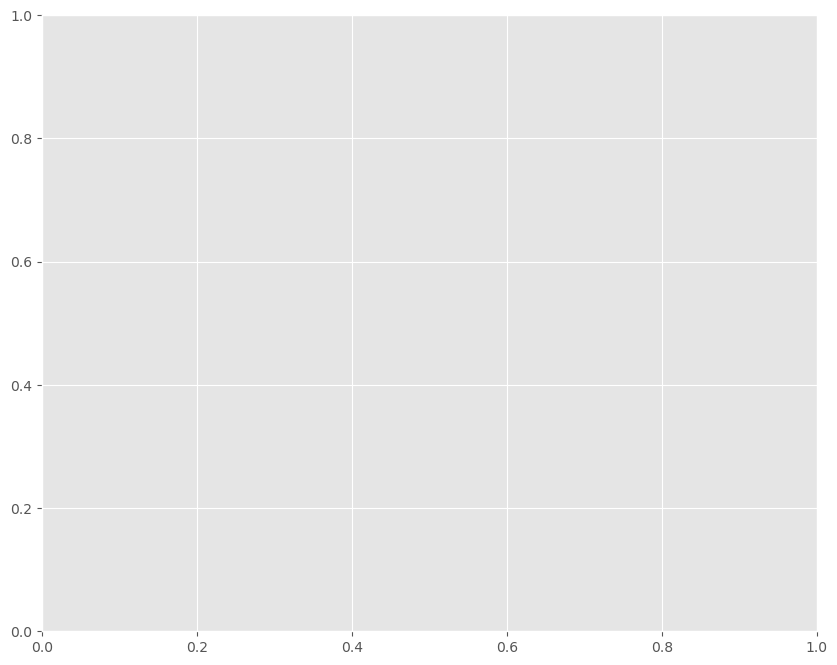

In [54]:
t.plot_decision_regions(Xtest[:,features],Ytest,clf=gb, res=0.02, cycle_marker=True, legend=1)

## Goal: Find the best pair of features (that gives maximum mean cross-validation accuracy) from all the available pairs for the problem in hand

In [58]:

nfolds=4
folds=t.generate_folds(X,Y,nfolds)

pairs = ["1100", "1010", "1001", "0110", "0101", "0011"]
pair_dict = {pair:0 for pair in pairs}

#now lets train and test on these folds...
totacc=[]
for k in range(nfolds):
    gb=GaussianBayes()
    gb.train(folds[k][0][:,:1],folds[k][1])
    pclasses,res=gb.test(folds[k][2][:,:1])
    acc=np.sum(pclasses==folds[k][3])/float(folds[k][3].shape[0])
    print ("[Info] Fold {} Accuracy = {}".format(k+1, acc))
    totacc.append(acc)

print (totacc, 'Mean Accuracy =', np.mean(totacc))
pair_dict["1100"] = np.mean(totacc)

# **********************************************************************

totacc=[]
for k in range(nfolds):
    gb=GaussianBayes()
    gb.train(folds[k][0][:,[0,2]],folds[k][1])
    pclasses,res=gb.test(folds[k][2][:,[0,2]])
    acc=np.sum(pclasses==folds[k][3])/float(folds[k][3].shape[0])
    print ("[Info] Fold {} Accuracy = {}".format(k+1, acc))
    totacc.append(acc)

print (totacc, 'Mean Accuracy =', np.mean(totacc))
pair_dict["1010"] = np.mean(totacc)

# **********************************************************************

totacc=[]
for k in range(nfolds):
    gb=GaussianBayes()
    gb.train(folds[k][0][:,[0,3]],folds[k][1])
    pclasses,res=gb.test(folds[k][2][:,[0,3]])
    acc=np.sum(pclasses==folds[k][3])/float(folds[k][3].shape[0])
    print ("[Info] Fold {} Accuracy = {}".format(k+1, acc))
    totacc.append(acc)

print (totacc, 'Mean Accuracy =', np.mean(totacc))
pair_dict["1001"] = np.mean(totacc)

# **********************************************************************

totacc=[]
for k in range(nfolds):
    gb=GaussianBayes()
    gb.train(folds[k][0][:,1:2],folds[k][1])
    pclasses,res=gb.test(folds[k][2][:,1:2])
    acc=np.sum(pclasses==folds[k][3])/float(folds[k][3].shape[0])
    print ("[Info] Fold {} Accuracy = {}".format(k+1, acc))
    totacc.append(acc)

print (totacc, 'Mean Accuracy =', np.mean(totacc))
pair_dict["0110"] = np.mean(totacc)

# **********************************************************************

totacc=[]
for k in range(nfolds):
    gb=GaussianBayes()
    gb.train(folds[k][0][:,[1,3]],folds[k][1])
    pclasses,res=gb.test(folds[k][2][:,[1,3]])
    acc=np.sum(pclasses==folds[k][3])/float(folds[k][3].shape[0])
    print ("[Info] Fold {} Accuracy = {}".format(k+1, acc))
    totacc.append(acc)

print (totacc, 'Mean Accuracy =', np.mean(totacc))
pair_dict["0101"] = np.mean(totacc)

# **********************************************************************

totacc=[]
for k in range(nfolds):
    gb=GaussianBayes()
    gb.train(folds[k][0][:,2:],folds[k][1])
    pclasses,res=gb.test(folds[k][2][:,2:])
    acc=np.sum(pclasses==folds[k][3])/float(folds[k][3].shape[0])
    print ("[Info] Fold {} Accuracy = {}".format(k+1, acc))
    totacc.append(acc)

print (totacc, 'Mean Accuracy =', np.mean(totacc))
pair_dict["0011"] = np.mean(totacc)


Generating CV data for 3 classes
1
(1,)
1
(1,)
1
(1,)
1
(1,)
1
(1,)
1
(1,)
1
(1,)
1
(1,)
1
(1,)
1
(1,)
1
(1,)
1
(1,)
1
(1,)
1
(1,)
1
(1,)
1
(1,)
1
(1,)
1
(1,)
1
(1,)
1
(1,)
1
(1,)
1
(1,)
1
(1,)
1
(1,)
1
(1,)
1
(1,)
1
(1,)
1
(1,)
1
(1,)
1
(1,)
1
(1,)
1
(1,)
1
(1,)
1
(1,)
1
(1,)
1
(1,)
1
(1,)
1
(1,)
1
(1,)
1
(1,)
1
(1,)
1
(1,)
1
(1,)
1
(1,)
1
(1,)
1
(1,)
1
(1,)
1
(1,)
1
(1,)
1
(1,)
1
(1,)
1
(1,)
1
(1,)
1
(1,)
1
(1,)
1
(1,)
1
(1,)
1
(1,)
1
(1,)
1
(1,)
1
(1,)
1
(1,)
1
(1,)
1
(1,)
1
(1,)
1
(1,)
1
(1,)
1
(1,)
1
(1,)
1
(1,)
1
(1,)
1
(1,)
1
(1,)
1
(1,)
1
(1,)
1
(1,)
1
(1,)
1
(1,)
1
(1,)
1
(1,)
1
(1,)
1
(1,)
1
(1,)
1
(1,)
1
(1,)
1
(1,)
1
(1,)
1
(1,)
1
(1,)
1
(1,)
1
(1,)
1
(1,)
1
(1,)
1
(1,)
1
(1,)
1
(1,)
1
(1,)
1
(1,)
1
(1,)
1
(1,)
1
(1,)
1
(1,)
1
(1,)
1
(1,)
1
(1,)
1
(1,)
1
(1,)
1
(1,)
[Info] Fold 1 Accuracy = 0.6666666666666666
1
(1,)
1
(1,)
1
(1,)
1
(1,)
1
(1,)
1
(1,)
1
(1,)
1
(1,)
1
(1,)
1
(1,)
1
(1,)
1
(1,)
1
(1,)
1
(1,)
1
(1,)
1
(1,)
1
(1,)
1
(1,)
1
(1,)
1
(1,)
1
(1,)
1
(1,)
1
(1,)
1
(1,)

In [59]:
pair_dict

{'1100': 0.7083333333333333,
 '1010': 0.9583333333333334,
 '1001': 0.9513888888888888,
 '0110': 0.5208333333333334,
 '0101': 0.9444444444444444,
 '0011': 0.9652777777777778}

In [62]:
max_pair = max(pair_dict, key=pair_dict.get)
max_value = pair_dict[max_pair]
print(max_pair, max_value)

0011 0.9652777777777778


So, (Petal Length, Petal Width)  is the pair that gives maximum mean cross-validation accuracy!